# Movie Genre Classification (Naive Bayes and Logistic Regression)
### by Diptorshi Tripathi, VIT-AP University

In [1]:
#Importing the required modules.
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [2]:
#Loading the data.
train_data = pd.read_csv("C:/Users/dipto/Desktop/codsoft/Task 1- Movie Genre Classification/train_data.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])
print(train_data.head())
test_data = pd.read_csv("C:/Users/dipto/Desktop/codsoft/Task 1- Movie Genre Classification/test_data.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])
print(test_data.head())
test_solution = pd.read_csv("C:/Users/dipto/Desktop/codsoft/Task 1- Movie Genre Classification/test_data_solution.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])
print(test_solution.head())

C:\Users\dipto\AppData\Local\Temp\ipykernel_17576\2167841579.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  train_data = pd.read_csv("C:/Users/dipto/Desktop/codsoft/Task 1- Movie Genre Classification/train_data.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])


   ID                               TITLE       GENRE  \
0   1       Oscar et la dame rose (2009)       drama    
1   2                       Cupid (1997)    thriller    
2   3   Young, Wild and Wonderful (1980)       adult    
3   4              The Secret Sin (1915)       drama    
4   5             The Unrecovered (2007)       drama    

                                         DESCRIPTION  
0   Listening in to a conversation between his do...  
1   A brother and sister with a past incestuous r...  
2   As the bus empties the students for their fie...  
3   To help their unemployed father make ends mee...  
4   The film's title refers not only to the un-re...  


C:\Users\dipto\AppData\Local\Temp\ipykernel_17576\2167841579.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  test_data = pd.read_csv("C:/Users/dipto/Desktop/codsoft/Task 1- Movie Genre Classification/test_data.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])


   ID                          TITLE  \
0   1          Edgar's Lunch (1998)    
1   2      La guerra de papá (1977)    
2   3   Off the Beaten Track (2010)    
3   4        Meu Amigo Hindu (2015)    
4   5             Er nu zhai (1955)    

                                               GENRE  DESCRIPTION  
0   L.R. Brane loves his life - his car, his apar...          NaN  
1   Spain, March 1964: Quico is a very naughty ch...          NaN  
2   One year in the life of Albin and his family ...          NaN  
3   His father has died, he hasn't spoken with hi...          NaN  
4   Before he was known internationally as a mart...          NaN  


C:\Users\dipto\AppData\Local\Temp\ipykernel_17576\2167841579.py:6: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  test_solution = pd.read_csv("C:/Users/dipto/Desktop/codsoft/Task 1- Movie Genre Classification/test_data_solution.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])


   ID                          TITLE          GENRE  \
0   1          Edgar's Lunch (1998)       thriller    
1   2      La guerra de papá (1977)         comedy    
2   3   Off the Beaten Track (2010)    documentary    
3   4        Meu Amigo Hindu (2015)          drama    
4   5             Er nu zhai (1955)          drama    

                                         DESCRIPTION  
0   L.R. Brane loves his life - his car, his apar...  
1   Spain, March 1964: Quico is a very naughty ch...  
2   One year in the life of Albin and his family ...  
3   His father has died, he hasn't spoken with hi...  
4   Before he was known internationally as a mart...  


In [3]:
#Handling missing values.
train_data['DESCRIPTION'] = train_data['DESCRIPTION'].fillna('')
test_data['DESCRIPTION'] = test_data['DESCRIPTION'].fillna('')

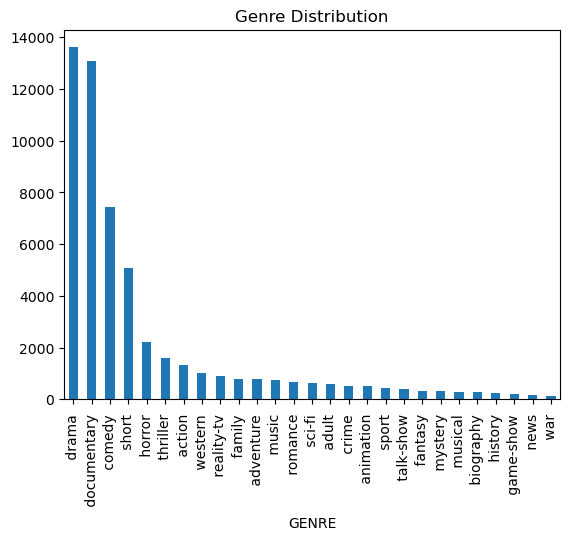

In [4]:
#Visualizing genre distributions.
genre_distribution = train_data['GENRE'].value_counts()
genre_distribution.plot(kind='bar', title='Genre Distribution')
plt.show()

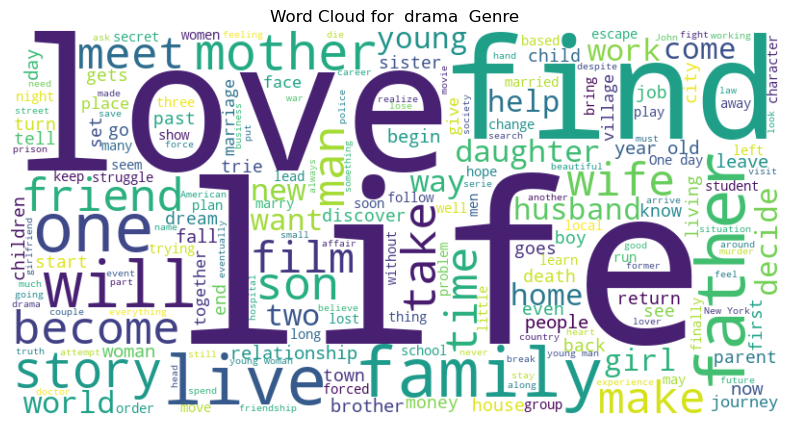

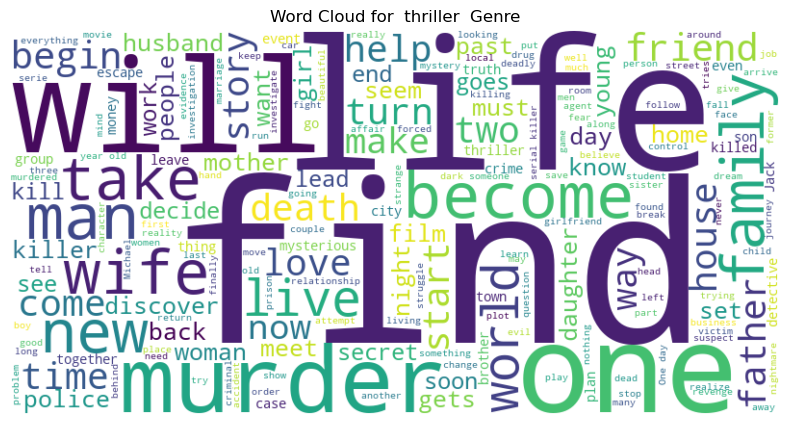

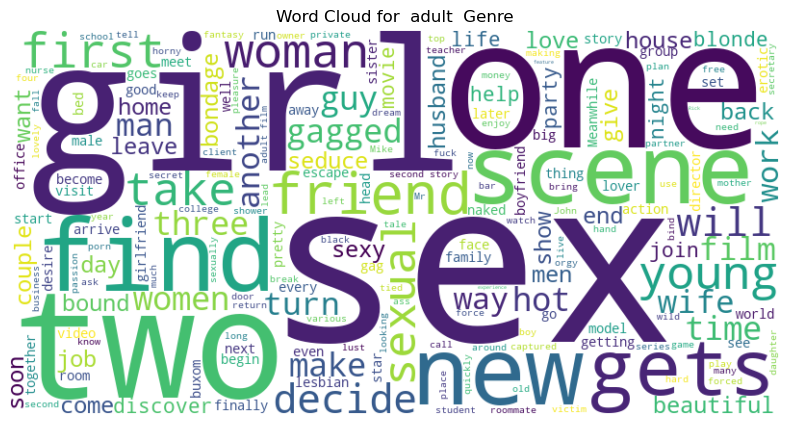

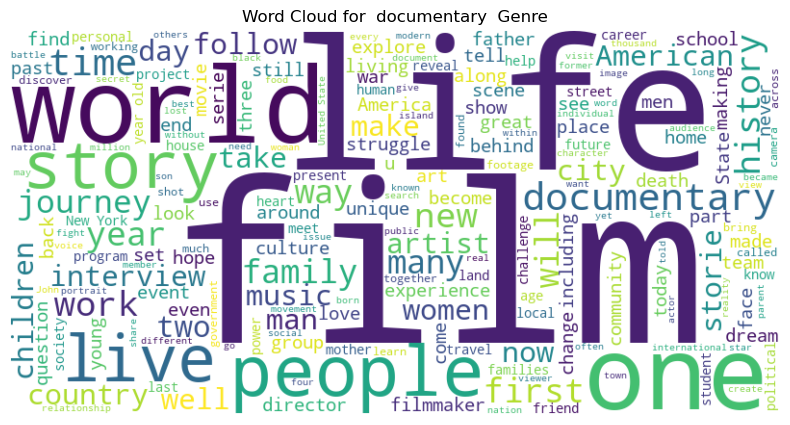

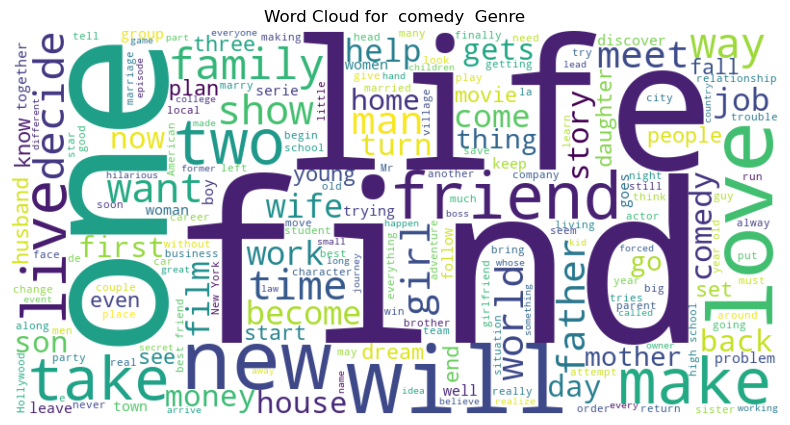

...

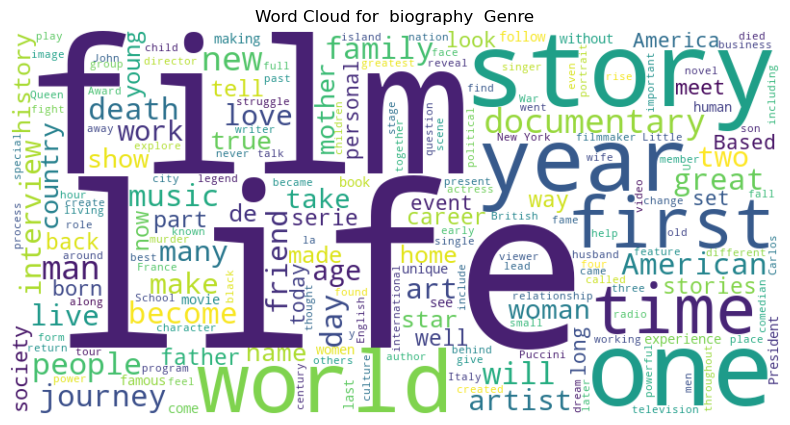

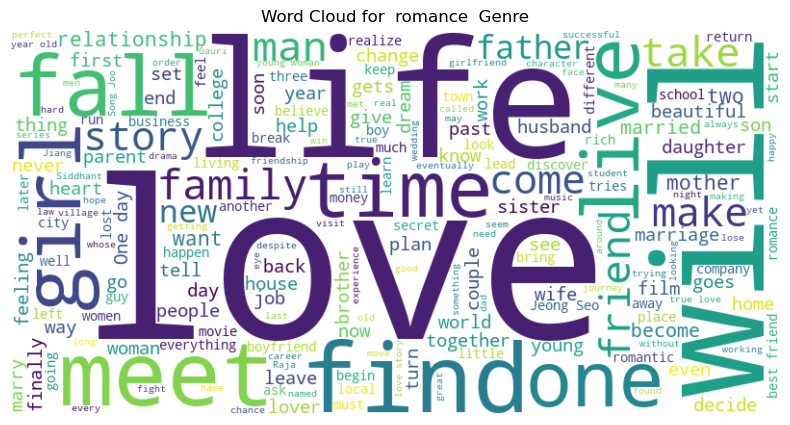

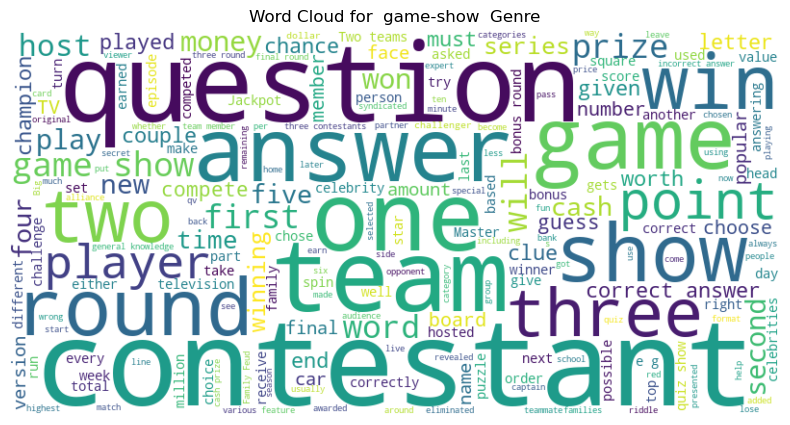

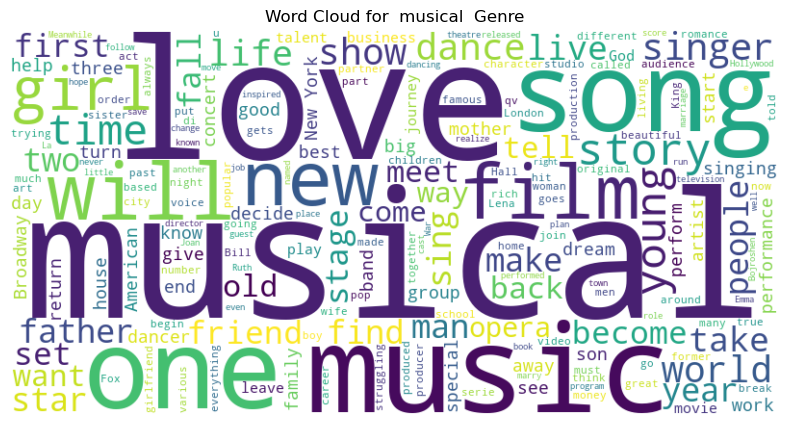

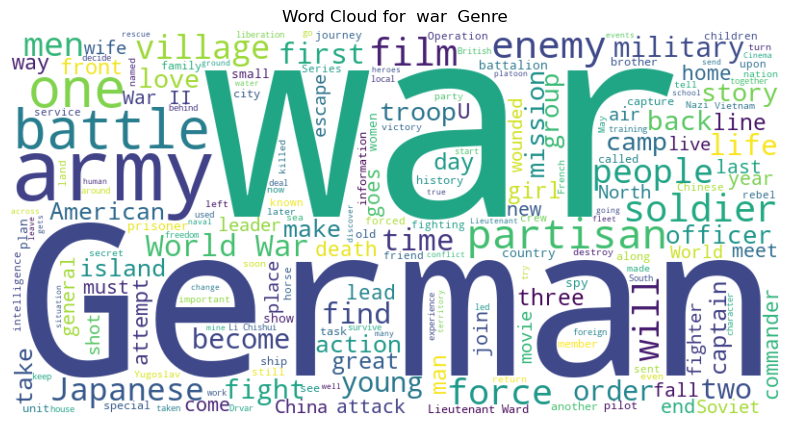

In [5]:
#Visualizing genres using WordCloud.
genres = train_data['GENRE'].unique()
for genre in genres:
    text = ' '.join(train_data[train_data['GENRE'] == genre]['DESCRIPTION'])
    wordcloud = WordCloud(width=800, height=400, random_state=42, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre')
    plt.axis('off')
    plt.show()

In [6]:
#Feature Engineering with Data.
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(train_data['DESCRIPTION'])
X_test = vectorizer.transform(test_data['DESCRIPTION'])
y = train_data['GENRE']

In [7]:
#Implementing Naive Bayes.
nb_model = MultinomialNB(alpha = 0.01)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
nb_model.fit(X_train, y_train)

nb_predictions = nb_model.predict(X_val)

In [8]:
#Evaluation of Model.
print("Naive Bayes Model:")
print("Accuracy:", accuracy_score(y_val, nb_predictions)*100)
print("Classification Report:\n", classification_report(y_val, nb_predictions))
print("Confusion Matrix:\n", confusion_matrix(y_val, nb_predictions))

Naive Bayes Model:
Accuracy: 54.431430415936546
Classification Report:
                precision    recall  f1-score   support

      action        0.59      0.17      0.26       263
       adult        0.68      0.12      0.20       112
   adventure        0.41      0.09      0.15       139
   animation        0.50      0.04      0.07       104
   biography        0.00      0.00      0.00        61
      comedy        0.52      0.44      0.48      1443
       crime        0.00      0.00      0.00       107
 documentary        0.60      0.88      0.71      2659
       drama        0.48      0.82      0.60      2697
      family        0.57      0.03      0.05       150
     fantasy        0.25      0.01      0.03        74
   game-show        0.95      0.45      0.61        40
     history        0.00      0.00      0.00        45
      horror        0.73      0.42      0.53       431
       music        0.67      0.42      0.51       144
     musical        0.00      0.00      0.00   

C:\Users\dipto\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dipto\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dipto\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [9]:
nb_test_predictions = nb_model.predict(X_test)

In [10]:
#Creating a prediction function.
def predict_genre(description, model):
    description_vectorized = vectorizer.transform([description])
    prediction = model.predict(description_vectorized)
    return prediction[0]

In [11]:
#Testing out some examples.
example_description = "In this movie, a woman sacrifices her life for her husband so he can save the world."
nb_prediction = predict_genre(example_description, nb_model)

print(f"Naive Bayes Prediction: {nb_prediction}")

Naive Bayes Prediction:  drama 


In [12]:
example_description2 = "A movie showing the mass murder of jews in poland during the world war."
nb_prediction2 = predict_genre(example_description2, nb_model)

print(f"Naive Bayes Prediction: {nb_prediction2}")

Naive Bayes Prediction:  documentary 


In [13]:
#Tuning the model further.
from sklearn.model_selection import GridSearchCV
param_grid = {'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}
grid_search = GridSearchCV(MultinomialNB(), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
nb_model_tuned = MultinomialNB(alpha=best_params['alpha'])
nb_model_tuned.fit(X_train, y_train)

MultinomialNB(alpha=0.1)

In [14]:
example_description3 = "Guy meets a gamer girl online, turns out the girl was a cat."
nb_prediction3 = predict_genre(example_description3, nb_model_tuned)
print(f"Tuned Naive Bayes Prediction: {nb_prediction3}")

Tuned Naive Bayes Prediction:  comedy 


In [15]:
#Now, implementing Logistic Regression.
logreg_model = LogisticRegression(max_iter=500)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
logreg_model.fit(X_train, y_train)
logreg_predictions = logreg_model.predict(X_val)

print("\nLogistic Regression Model:")
print("Accuracy:", accuracy_score(y_val, logreg_predictions)*100)
print("Classification Report:\n", classification_report(y_val, logreg_predictions))
print("Confusion Matrix:\n", confusion_matrix(y_val, logreg_predictions))


Logistic Regression Model:
Accuracy: 59.04270035967906


C:\Users\dipto\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dipto\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dipto\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
                precision    recall  f1-score   support

      action        0.54      0.28      0.37       263
       adult        0.83      0.22      0.35       112
   adventure        0.36      0.12      0.17       139
   animation        0.58      0.07      0.12       104
   biography        0.00      0.00      0.00        61
      comedy        0.53      0.60      0.56      1443
       crime        0.20      0.01      0.02       107
 documentary        0.67      0.86      0.76      2659
       drama        0.55      0.79      0.65      2697
      family        0.41      0.09      0.14       150
     fantasy        0.00      0.00      0.00        74
   game-show        1.00      0.42      0.60        40
     history        0.00      0.00      0.00        45
      horror        0.64      0.57      0.60       431
       music        0.63      0.48      0.54       144
     musical        0.50      0.02      0.04        50
     mystery        1.00      0.02      

In [16]:
#Finally, trying out the Logreg Model.
example_description4 = "A warrior invents weapons unknown to man and destroys a corrupt government."
logreg_prediction = predict_genre(example_description4, logreg_model)

print(f"Logistic Regression Prediction: {logreg_prediction}")

Logistic Regression Prediction:  action 


# Conclusion

This code implements the given dataset, and introduces two Machine Learning Models- Naive Bayes, and Logistic Regression. Upon comparison, it is seen that the Logistic Regression model provides a better yield in terms of accuracy and closeness to a depiction of the genre.